<a href="https://colab.research.google.com/github/CristhianSeverino/customer-churn-and-contextual-chat/blob/staging/C4_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Customer Churn and Contextual Chat C4**

> Este **Notebook** es una creación de: **Cristhian Calle Severino**.

---

* **GitHub**: https://github.com/CristhianSeverino
* **LinkedIn**: https://www.linkedin.com/in/cristhianandrescalleseverino/

---

Este proyecto **emula un Data Product de Machine Learning (ML) con despliegue en AWS**. Se inspira en la arquitectura **Arana**.

### **Incluye:**

* **Creación de Datos Sintéticos**: Estos datos simulan usuarios de **MallPlaza**, un nombre genérico para un supuesto ficticio, dado que grandes centros comerciales homónimos existen en ciudades de América (como Santiago de Chile y Manizales, donde resido). Esta creación se basa en un supuesto de **Ingeniería y Arquitectura de Datos** que se detalla en el **Road Map**.

---

## **Módulos del Proyecto**

El proyecto está estructurado en los siguientes **Módulos**:

> * **Módulo 1 - Creación de Datos Sintéticos**: Emula un proceso **ELT** (Extracción, Carga y Transformación) de ingesta, carga y posterior transformación de datos. El resultado es un *dataset* limpio, listo para el entrenamiento de modelos de ML.
> * **Módulo 2 - EDA (*Exploratory Data Analysis*)**: Análisis de datos exploratorio para la identificación de *insights* previos al ML. Incluye la búsqueda de características de enriquecimiento y el desarrollo de **Feature Engineering**.
> * **Módulo 3 - Entrenamiento y Evaluación del Algoritmo**: Desarrollo del modelo, métricas de ajuste, evaluación de precisión y **Fine Tuning**.
> * **Módulo 4 - Despliegue en AWS**: Implementación y prueba del despliegue en la nube.

---

## **Prerrequisitos y Recomendaciones**

**Nota**: Para este proyecto se emplea **AWS como *cloud platform***.

Es **indispensable** poseer conocimientos en las siguientes tecnologías para comprender a cabalidad los aspectos técnicos:

* **Lenguajes y Bases de Datos**: Python, SQL.
* **Big Data y ML**: PySpark, Keras, Scikit-learn, PyTorch.
* **Cloud y Herramientas MLOps**: AWS.
* **IA y Desarrollo de Aplicaciones**: LangChain, RAG, Streamlit, Gradio.

Para una comprensión general del proyecto, **recomiendo encarecidamente la lectura del Road Map** y una revisión general de la documentación del código. 🦾

> ¡Que disfrutes explorando este proyecto! Exitosa semana. 🐱‍🏍

# **Modulo 2 - EDA**

# **Instalacción E Importación de Librerias**📚

In [1]:
!pip install -U kaleido

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.3/66.3 kB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.3/52.3 kB 1.5 MB/s eta 0:00:00


In [2]:
!pip install boto3

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.3/139.3 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.0/14.0 MB 76.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 5.0 MB/s eta 0:00:00


In [30]:

!pip install awscli
print("="*45+"   Librerias AWS Instaldas   "+"="*45)

=============================================   Librerias AWS Instaldas   =============================================


In [4]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from google.colab import files
import missingno as msno
import os
import boto3
from google.colab import userdata
import botocore.exceptions
import polars as pl
from datetime import datetime
import matplotlib.colors as mcolors
from IPython.display import display
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import PolynomialFeatures
import logging
from typing import List, Union, Optional

warnings.filterwarnings('ignore')
print("="*150)
print("="*45+"   Librerias Importadas  "+"="*45)
print("="*150)



=============================================   Librerias Importadas  =============================================


In [5]:
!pip install faker
print("="*150)
print(" "*50+"Librerias instaladas")
print("="*150)


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 11.2 MB/s eta 0:00:00
                                                  Librerias instaladas


# **Credenciales**🎫

**Ojo Actualizar Credenciales para el rol del Proyecto. Segun Data gobernance**👀

In [28]:
region_name=userdata.get('AWS_REGION')
bucket_name=userdata.get('s3_mallflow')
s3 = s3 = boto3.client(
    's3',
    aws_access_key_id=userdata.get('AWS_ACCESS_KEY_ID'),
    aws_secret_access_key=userdata.get('AWS_SECRET_ACCESS_KEY')
)
git_path= userdata.get('GIT_PATH')
print("="*150)
print(" "*50+"Paths Ok")
print("="*150)

                                                  Paths Ok


In [27]:
aws_dir = '/root/.aws'
os.makedirs(aws_dir, exist_ok=True)
with open(os.path.join(aws_dir, 'credentials'), 'w') as f:
    f.write(f'[default]\n')
    f.write(f'aws_access_key_id = {aws_access_key_id}\n')
    f.write(f'aws_secret_access_key = {aws_secret_access_key}\n')
# Write 'config'
with open(os.path.join(aws_dir, 'config'), 'w') as f:
    f.write(f'[default]\n')
    f.write(f'region = {region_name}\n')
print("="*100)
print(" "*25+"Archivos de cofiguracion de AWs creados Exitosamente ☕")
print("="*100)

                         Archivos de cofiguracion de AWs creados Exitosamente ☕


# **Carga del Dataset desde el Bucket de S3**💽

In [8]:
def download_from_s3(bucket_name, s3_file_path, local_file_path):
    try:
        #Configuurar cliente S3
        s3_client = boto3.client('s3')

        #crear el directorio local
        local_dir = os.path.dirname(local_file_path)
        if local_dir:
            os.makedirs(local_dir, exist_ok=True)

        #Descargar el Archivo desde S3
        s3_client.download_file(bucket_name, s3_file_path, local_file_path)
        print(f"Archivo Descargado Con ¡Exito!: {local_file_path}")
        return True

    except botocore.exceptions.ClientError as e:
        if e.response['Error']['Code']== "404":
            print(f"El archivo {s3_file_path} no existe en el buket {bucket_name}. VERIFICA LOS NOMBRES")
        else:
            print(f"Error al descargar el archivo desde S3: {str(e)}")
            return False

    except Exception as e:
        print(f"Error inesperado: {str(e)}")
        return False


In [9]:
#=========================   Inicializacion de las funciones de optencion de los datasets   ==========================

if __name__ == "__main__":
  #Cofigurar Credeciales
    bucket_name = "mall-flow"


    files_download = [
        ("warehouse-ml/churn_abril_mallplaza/churn_abril_mallplaza.csv", "content/churn_abril_mallplaza.csv"),
    ]

    for s3_file_path, local_file_path in files_download:
        print(f"Descargando {s3_file_path} a {local_file_path}...")
        success = download_from_s3(bucket_name, s3_file_path, local_file_path)
        if not success:
            print(f"No se Pudo descargar {s3_file_path}")


Descargando warehouse-ml/churn_abril_mallplaza/churn_abril_mallplaza.csv a content/churn_abril_mallplaza.csv...
Archivo Descargado Con ¡Exito!: content/churn_abril_mallplaza.csv


# **Limpeza Data Set con Pandas** 💾

In [10]:
#=========================================   Cargar y Analizar datos   =====================================

def cargar_analizardf(ruta_csv, nombre_df="DataFrame"):
    try:
      df = pd.read_csv(ruta_csv)
      print(f"{'='*17}   Data Frame '{nombre_df}' Creado con Éxito   {'='*17}")
      print(df.head(5))
      print(f"{'='*17}   Estadísticas del DF '{nombre_df}   {'='*17}")
      print(df.describe())
      print(f"{'='*17}   Información del DF '{nombre_df}'   {'='*17}")
      df.info()
      print(f"{'='*17}   Valores Nulos del DF '{nombre_df}'   {'='*17}")
      print(df.isnull().sum())
      print("Porcentaje de nulos:\n", df.isnull().sum() / len(df))
      '''msno.matrix(df)
      plt.title(f'Matriz de Valores nulos de: {nombre_df}')
      plt.savefig(f'MissingMatriz_{nombre_df}.png')
      print(f"{'='*17}   Matriz de Valores nulos de: '{nombre_df}' Guardada con exito   {'='*17}")
      plt.show()
      plt.close()'''

      return df
    except FileNotFoundError:
      print(f"Error: No se encontro el Archivo en la ruta: {ruta_csv}")
      return None
    except Exception as e:
      print(f"Ocurrio un error inesperado: {e}")
      return None


ruta_churn = '/content/content/churn_abril_mallplaza.csv'

#Cagar y Analizar Cada Data Frame
print("Analizando DataFrame de Usuarios:")
churn_df = cargar_analizardf(ruta_churn, nombre_df="churn_df")
print("\n" + "="*50)


# Verificar que los DataFrames no sean None antes de imprimir
print("\n" + "="*50)
print(" "*15 + "Imprimiendo Data Frames")
print("\n" + "="*50)


if churn_df is not None:
    print("Usuarios DataFrame no es un None")
    print(churn_df.head(7))
else: print("Error: usuarios_df es None")






Analizando DataFrame de Usuarios:
=================   Data Frame 'churn_df' Creado con Éxito   =================
                             customerId                               name  \
0  0a415de2-2469-4f34-a77b-a947eef941e9         Matías Frank Méndez Campos   
1  0d3129b4-2525-4235-8765-77eaa606d6cf  Benjamín Joaquín Guajardo Cabrera   
2  5b19695e-2fe1-4375-b723-6aaa414f49b9         Juan Claudio Vera Riquelme   
3  de67247b-dded-46c2-aeba-1bf16cc73113                     Alejandra Sáez   
4  b2609f86-faf8-4d2e-a569-ba76c4f559d5                Marta Meza González   

   age  visits  avg_session_time  complaints  total_session_time  \
0   51       3             32.57           0           97.120068   
1   25      13             64.52           8          826.446774   
2   79      27             84.52           2         2287.022366   
3   32      28             65.70           1         1828.755038   
4   74      20             27.03           8          543.183295   

   compla

# **Analisis Grafico Primario** 📊
> Los graficos se guardan autoaticamente

In [11]:
def generar_histogramas_plotly(dataframes, output_dir='histogramas_plotly', save_png=True):
    """
    Genera histogramas interactivos para todas las columnas numéricas de una lista de DataFrames
    usando Plotly y los guarda como PNG.

    Parámetros:
    - dataframes (list): Lista de DataFrames o un solo DataFrame.
    - output_dir (str): Directorio donde se guardarán los archivos PNG.
    - save_png (bool): Si True, guarda los histogramas como PNG.

    Retorna:
    - list: Lista de rutas de los archivos PNG generados.
    """
    # Asegurar que dataframes sea una lista
    if isinstance(dataframes, pd.DataFrame):
        dataframes = [dataframes]

    # Crear directorio de salida si no existe
    os.makedirs(output_dir, exist_ok=True)

    # Lista para almacenar rutas de archivos generados
    archivos_generados = []

    # Iterar sobre cada DataFrame
    for idx, df in enumerate(dataframes):
        df_name = f"DataFrame_{idx + 1}"
        print(f"\n================== Histogramas para {df_name} ===================")

        # Seleccionar columnas numéricas
        # Nota: Plotly generalmente funciona bien con todos los tipos numéricos de NumPy
        num_cols = df.select_dtypes(include=np.number).columns

        for col in num_cols:
            print(f"================== Histograma de {col} ===================")

            # 1. Crear el Histograma con Plotly Express
            fig = px.histogram(
                df,
                x=col,
                # Opciones de personalización para un estilo limpio similar a Seaborn/Matplotlib
                title=f'Histograma de {col}',
                labels={col: col, 'count': 'Frecuencia'}, # Personaliza la etiqueta 'count'
                color_discrete_sequence=['#4682b4'] # 'skyblue' en un color similar
            )

            # 2. Personalizar el Layout (opcional, pero recomendado)
            fig.update_layout(
                xaxis_title=col,
                yaxis_title='Frecuencia', # 'Count' en español
                bargap=0.05,  # Espacio entre barras
                # Fondo blanco para el área del gráfico y gris claro para el fondo de la figura
                plot_bgcolor='white',
                paper_bgcolor='#f7f7f7',
                font=dict(family="Arial", size=12, color="black")
            )

            # 3. Mostrar y Guardar
            if save_png:
                filename = f'Histograma_{col}_{df_name}.png'
                filepath = os.path.join(output_dir, filename)

                # Plotly necesita 'kaleido' para guardar imágenes estáticas
                try:
                    fig.write_image(filepath, scale=2) # scale=2 mejora la resolución
                    print(f"Guardado: {filepath}")
                    archivos_generados.append(filepath)
                except ValueError as e:
                    if "A figure must be rendered before it can be saved" in str(e):
                         print("⚠️ ERROR: Plotly requiere la librería 'kaleido' para guardar PNGs. Por favor, ejecuta: pip install kaleido")
                    else:
                         print(f"Error al guardar la imagen: {e}")

            # Muestra el gráfico interactivo en un entorno como Jupyter
            fig.show()

    return archivos_generados


if __name__ == "__main__":

    rutas = generar_histogramas_plotly(dataframes=[churn_df], output_dir='histogramas_plotly_output', save_png=True)
    print("\nArchivos generados:", rutas)


================== Histogramas para DataFrame_1 ===================
================== Histograma de age ===================
Error al guardar la imagen: 
Image export using the "kaleido" engine requires the kaleido package,
which can be installed using pip:
    $ pip install -U kaleido



================== Histograma de visits ===================
Error al guardar la imagen: 
Image export using the "kaleido" engine requires the kaleido package,
which can be installed using pip:
    $ pip install -U kaleido



================== Histograma de avg_session_time ===================
Error al guardar la imagen: 
Image export using the "kaleido" engine requires the kaleido package,
which can be installed using pip:
    $ pip install -U kaleido



================== Histograma de complaints ===================
Error al guardar la imagen: 
Image export using the "kaleido" engine requires the kaleido package,
which can be installed using pip:
    $ pip install -U kaleido



================== Histograma de total_session_time ===================
Error al guardar la imagen: 
Image export using the "kaleido" engine requires the kaleido package,
which can be installed using pip:
    $ pip install -U kaleido



================== Histograma de complaints_per_visit ===================
Error al guardar la imagen: 
Image export using the "kaleido" engine requires the kaleido package,
which can be installed using pip:
    $ pip install -U kaleido



================== Histograma de log_visits ===================
Error al guardar la imagen: 
Image export using the "kaleido" engine requires the kaleido package,
which can be installed using pip:
    $ pip install -U kaleido



================== Histograma de high_complaints_flag ===================
Error al guardar la imagen: 
Image export using the "kaleido" engine requires the kaleido package,
which can be installed using pip:
    $ pip install -U kaleido



================== Histograma de engagement_score ===================
Error al guardar la imagen: 
Image export using the "kaleido" engine requires the kaleido package,
which can be installed using pip:
    $ pip install -U kaleido



================== Histograma de gender_age_ifemale ===================
Error al guardar la imagen: 
Image export using the "kaleido" engine requires the kaleido package,
which can be installed using pip:
    $ pip install -U kaleido



================== Histograma de gender_age_imale ===================
Error al guardar la imagen: 
Image export using the "kaleido" engine requires the kaleido package,
which can be installed using pip:
    $ pip install -U kaleido



================== Histograma de gender_age_iother ===================
Error al guardar la imagen: 
Image export using the "kaleido" engine requires the kaleido package,
which can be installed using pip:
    $ pip install -U kaleido



================== Histograma de recency_days ===================
Error al guardar la imagen: 
Image export using the "kaleido" engine requires the kaleido package,
which can be installed using pip:
    $ pip install -U kaleido



================== Histograma de tenure_months ===================
Error al guardar la imagen: 
Image export using the "kaleido" engine requires the kaleido package,
which can be installed using pip:
    $ pip install -U kaleido



================== Histograma de data_usage_total ===================
Error al guardar la imagen: 
Image export using the "kaleido" engine requires the kaleido package,
which can be installed using pip:
    $ pip install -U kaleido




Archivos generados: []



================== Matriz de Correlación para DataFrame_1 ===================

Matriz de correlación para DataFrame_1:
                           age    visits  avg_session_time  complaints  \
age                   1.000000  0.001206          0.000352    0.001401   
visits                0.001206  1.000000          0.001320   -0.006219   
avg_session_time      0.000352  0.001320          1.000000    0.001240   
complaints            0.001401 -0.006219          0.001240    1.000000   
total_session_time    0.001227  0.675692          0.643980   -0.004570   
complaints_per_visit -0.001536 -0.511570          0.001392    0.354563   
log_visits            0.001526  0.944459          0.001656   -0.007176   
high_complaints_flag  0.001324 -0.005484          0.001973    0.866064   
engagement_score      0.000578  0.706200          0.520904   -0.244320   
gender_age_ifemale    0.339574  0.003501          0.006702    0.001387   
gender_age_imale      0.314999 -0.002797         -0.007101   -0.00

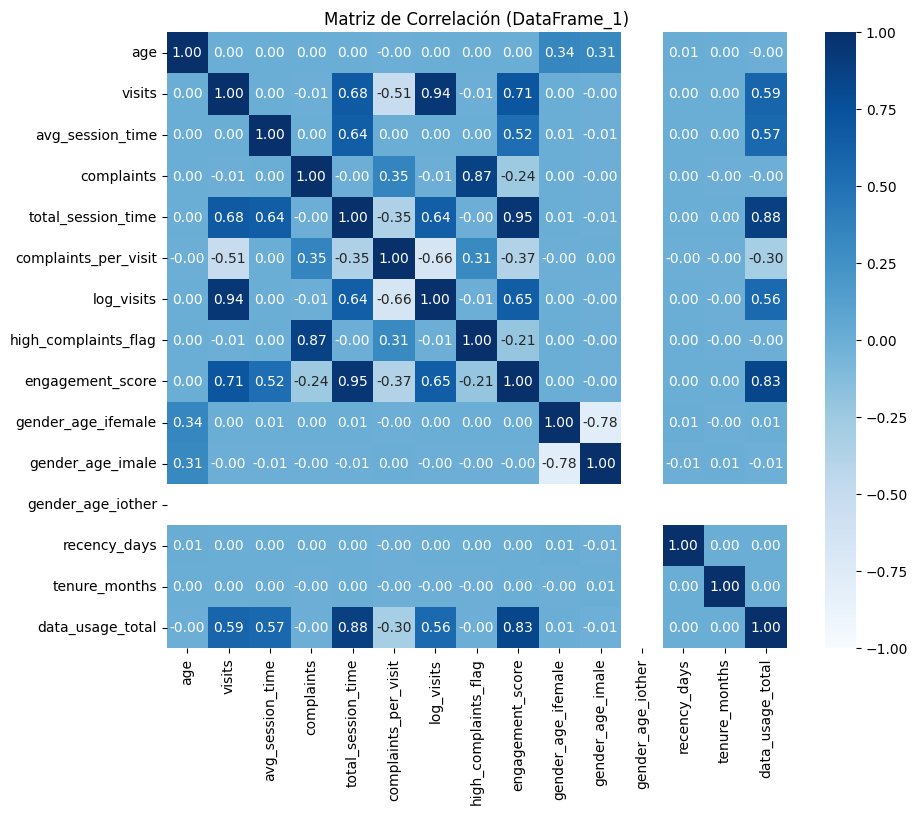

In [12]:
#================================   Generar Matrices de Correlación

def generar_matrices_correlacion(dataframes, output_dir='matrices_correlacion', save_png=True, cmap='Blues'):
    """
    Genera matrices de correlación para todas las columnas numéricas de una lista de DataFrames.
    Guarda los mapas de calor como PNG.

    Parámetros:
    - dataframes (list): Lista de DataFrames o un solo DataFrame.
    - output_dir (str): Directorio donde se guardarán los archivos PNG. Por defecto, 'matrices_correlacion'.
    - save_png (bool): Si True, guarda las matrices como PNG. Por defecto, True.
    - cmap (str): Mapa de colores de Seaborn para la matriz. Por defecto, 'Blues'.

    Retorna:
    - list: Lista de rutas de los archivos PNG generados.
    """
    # Asegurar que dataframes sea una lista
    if isinstance(dataframes, pd.DataFrame):
        dataframes = [dataframes]

    # Crear directorio de salida si no existe
    os.makedirs(output_dir, exist_ok=True)

    # Lista para almacenar rutas de archivos generados
    archivos_generados = []

    # Iterar sobre cada DataFrame
    for idx, df in enumerate(dataframes):
        df_name = f"DataFrame_{idx+1}"
        print(f"\n================== Matriz de Correlación para {df_name} ===================")

        # Seleccionar columnas numéricas
        num_cols = df.select_dtypes(include=np.number).columns

        if len(num_cols) < 2:
            print(f"Advertencia: {df_name} tiene menos de 2 columnas numéricas. Saltando...")
            continue

        # Calcular matriz de correlación
        corr_matrix = df[num_cols].corr()
        print(f"\nMatriz de correlación para {df_name}:\n{corr_matrix}")

        # Crear figura
        plt.figure(figsize=(10, 8))
        sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap=cmap, vmin=-1, vmax=1, center=0)
        plt.title(f'Matriz de Correlación ({df_name})')

        # Guardar PNG
        if save_png:
            filename = f'Matriz_Correlacion_{df_name}.png'
            filepath = os.path.join(output_dir, filename)
            plt.savefig(filepath)
            print(f"Guardado: {filepath}")
            archivos_generados.append(filepath)

        # Mostrar gráfico
        plt.show()
        plt.close()

    return archivos_generados
corr_1= generar_matrices_correlacion(dataframes=[churn_df], output_dir='matrices_correlacion_output', save_png=True, cmap='Blues')

# **Analisis Grafico Variables Categoricas** 📊
> Los graficos se guardan autoaticamente


In [13]:
def generar_barras_seaborn(dataframes, output_dir='graficos_barras_seaborn', save_png=True, include_cols=None):
    """
    Genera gráficos de barras estáticos (frecuencia de valores) para todas las
    columnas categóricas (o las especificadas) de una lista de DataFrames usando Seaborn
    y los guarda como PNG.

    Parámetros:
    - dataframes (list): Lista de DataFrames o un solo DataFrame.
    - output_dir (str): Directorio donde se guardarán los archivos PNG.
    - save_png (bool): Si True, guarda los gráficos como PNG.
    - include_cols (list, optional): Lista de nombres de columnas a incluir.
      Si es None, usa las columnas de tipo 'object' o 'category' (típicamente categóricas).

    Retorna:
    - list: Lista de rutas de los archivos PNG generados.
    """
    # Asegurar que dataframes sea una lista
    if isinstance(dataframes, pd.DataFrame):
        dataframes = [dataframes]

    # Crear directorio de salida si no existe
    os.makedirs(output_dir, exist_ok=True)

    # Lista para almacenar rutas de archivos generados
    archivos_generados = []

    # Iterar sobre cada DataFrame
    for idx, df in enumerate(dataframes):
        df_name = f"DataFrame_{idx + 1}"
        print(f"\n================== Gráficos de barras para {df_name} ===================")

        # Seleccionar columnas. Por defecto, usa columnas 'object' (categóricas)
        if include_cols is None:
            # Selecciona columnas de tipo 'object' o 'category'
            cols_to_plot = df.select_dtypes(include=['object', 'category']).columns
        else:
            # Usa las columnas especificadas y se asegura de que existan
            cols_to_plot = [col for col in include_cols if col in df.columns]

        if not cols_to_plot:
            print("No se encontraron columnas categóricas (o las especificadas) para graficar.")
            continue

        for col in cols_to_plot:
            print(f"================== Gráfico de barras de {col} ===================")

            # Crear la figura y el eje
            fig, ax = plt.subplots(figsize=(12, 6))  # Ajusta el tamaño para manejar datasets grandes

            # Generar el gráfico de barras con Seaborn (countplot para frecuencias)
            sns.countplot(x=col, data=df, ax=ax, palette='viridis', order=df[col].value_counts().index)

            # Personalizar el gráfico
            ax.set_title(f'Gráfico de Barras (Frecuencia) de {col}', fontsize=14)
            ax.set_xlabel(col, fontsize=12)
            ax.set_ylabel('Frecuencia', fontsize=12)
            ax.tick_params(axis='x', rotation=45)  # Rotar etiquetas si hay muchas categorías

            # Ajustar layout para evitar recortes
            plt.tight_layout()

            # Guardar si se especifica
            if save_png:
                filename = f'Barra_{col}_{df_name}.png'
                filepath = os.path.join(output_dir, filename)
                try:
                    plt.savefig(filepath, dpi=200, bbox_inches='tight')  # dpi para mejor resolución, bbox para evitar recortes
                    print(f"Guardado: {filepath}")
                    archivos_generados.append(filepath)
                except Exception as e:
                    print(f"Error al guardar la imagen: {e}")

            # Mostrar el gráfico en el notebook
            plt.show()

            # Cerrar la figura para liberar memoria (importante para datasets grandes o muchas columnas)
            plt.close(fig)

    return archivos_generados





================== Gráficos de barras para DataFrame_1 ===================
================== Gráfico de barras de complaints ===================
Guardado: barras_seaborn_output_especifico/Barra_complaints_DataFrame_1.png


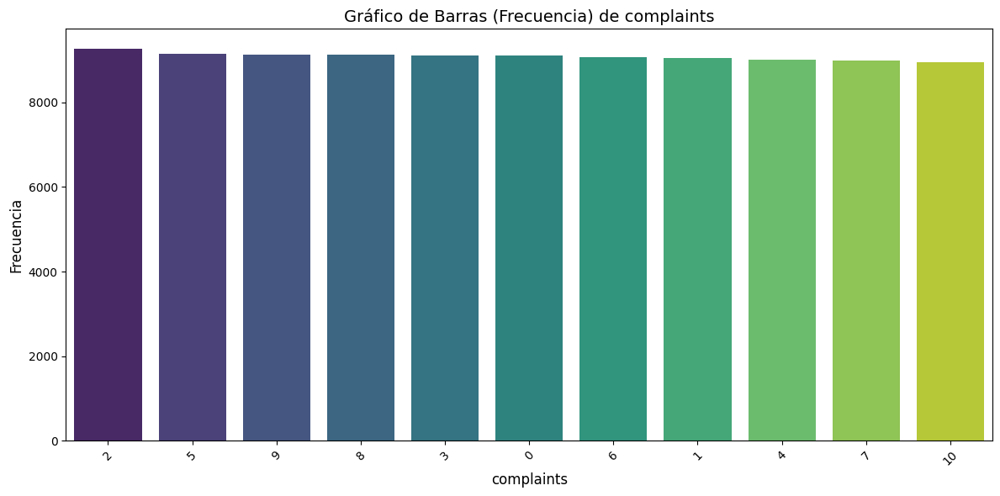

================== Gráfico de barras de high_complaints_flag ===================
Guardado: barras_seaborn_output_especifico/Barra_high_complaints_flag_DataFrame_1.png


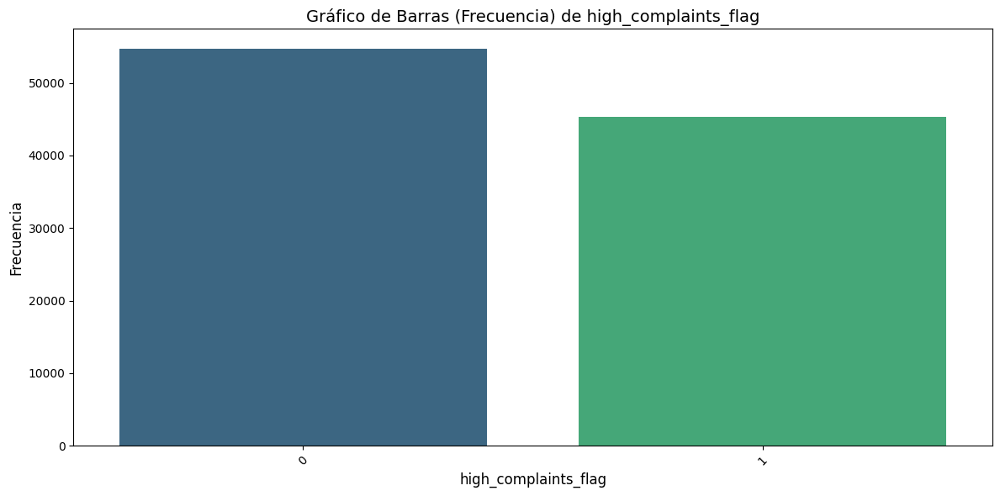

================== Gráfico de barras de location_Mall Central ===================
Guardado: barras_seaborn_output_especifico/Barra_location_Mall Central_DataFrame_1.png


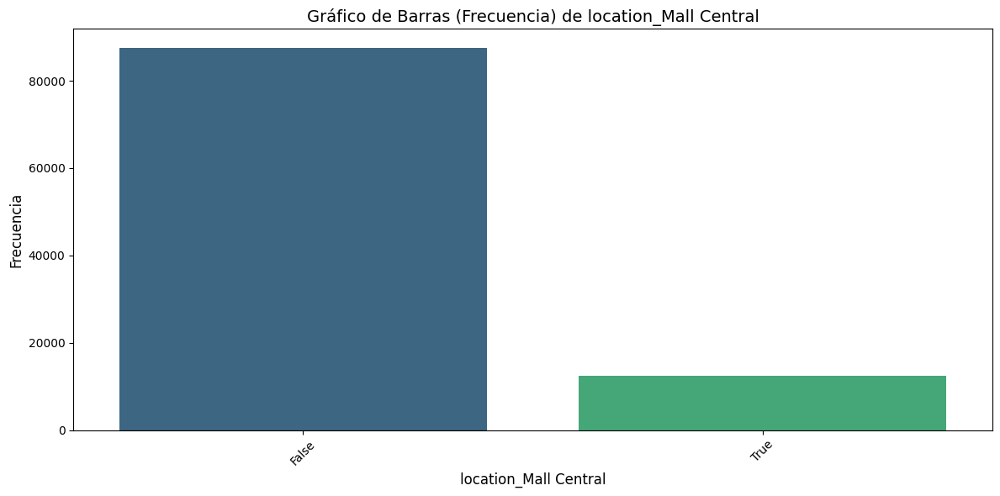

================== Gráfico de barras de location_Mall Comidas 1 ===================
Guardado: barras_seaborn_output_especifico/Barra_location_Mall Comidas 1_DataFrame_1.png


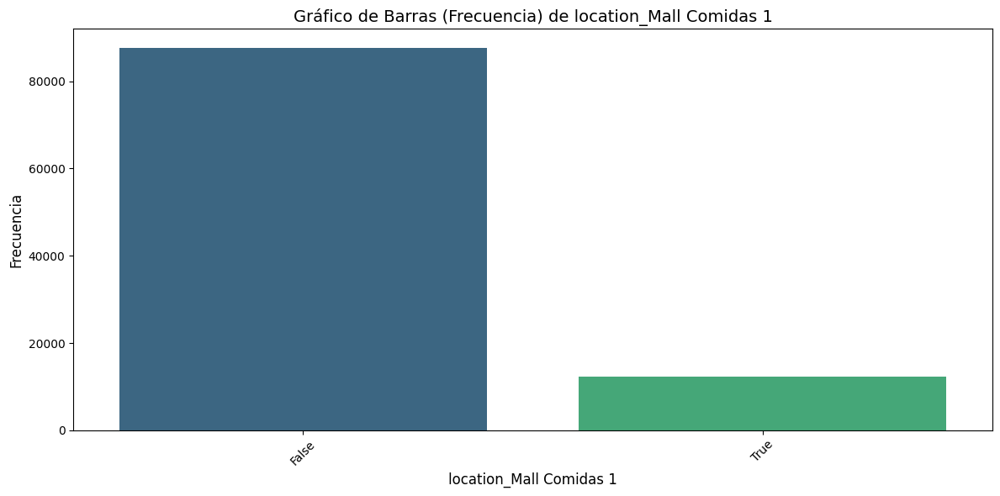

================== Gráfico de barras de location_Mall Comidas 2 ===================
Guardado: barras_seaborn_output_especifico/Barra_location_Mall Comidas 2_DataFrame_1.png


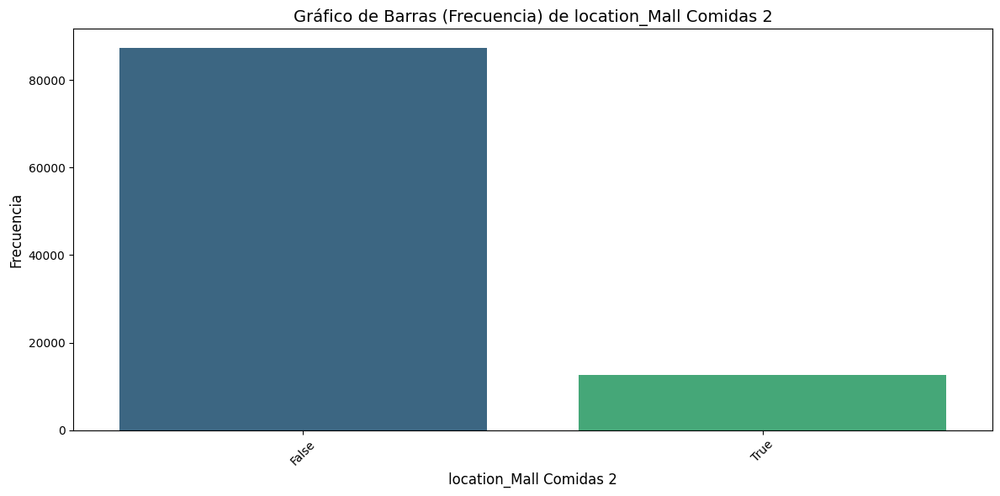

================== Gráfico de barras de location_Mega Tienda ===================
Guardado: barras_seaborn_output_especifico/Barra_location_Mega Tienda_DataFrame_1.png


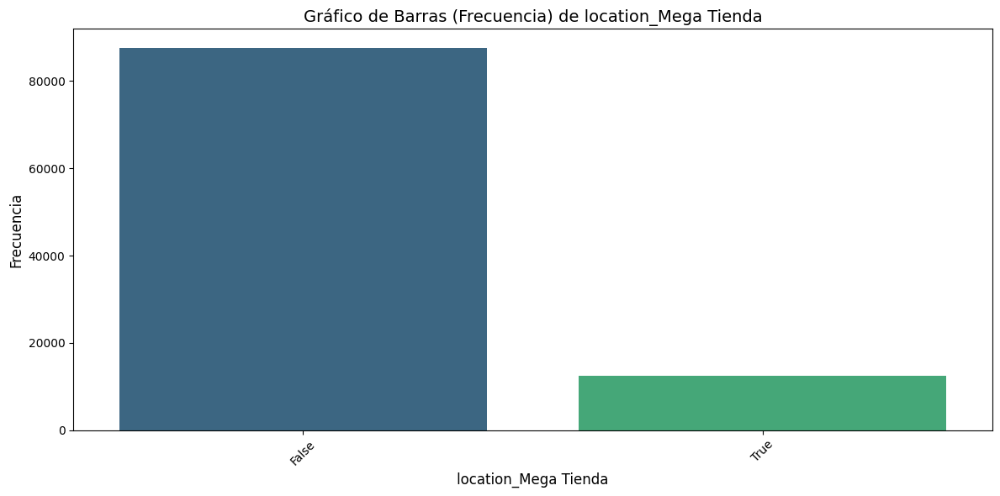

================== Gráfico de barras de device_type_Laptop ===================
Guardado: barras_seaborn_output_especifico/Barra_device_type_Laptop_DataFrame_1.png


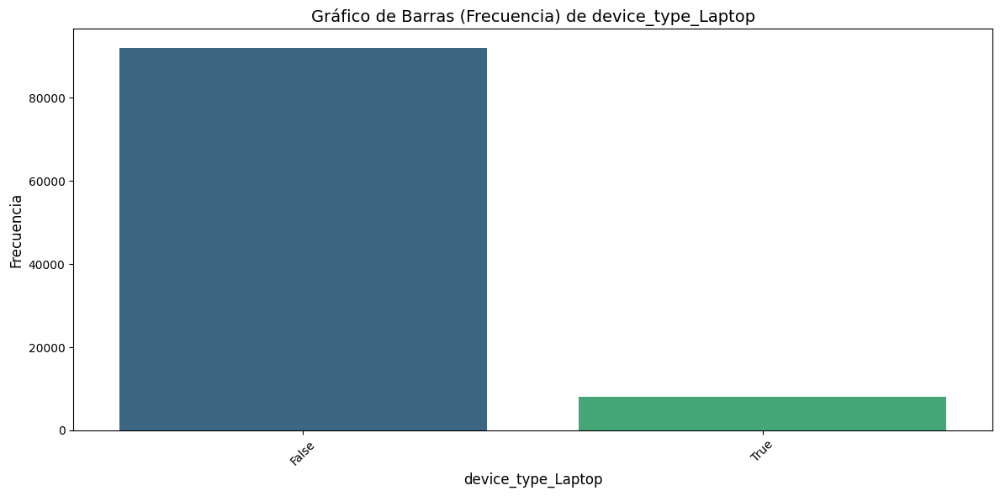

================== Gráfico de barras de device_type_Smartphone ===================
Guardado: barras_seaborn_output_especifico/Barra_device_type_Smartphone_DataFrame_1.png


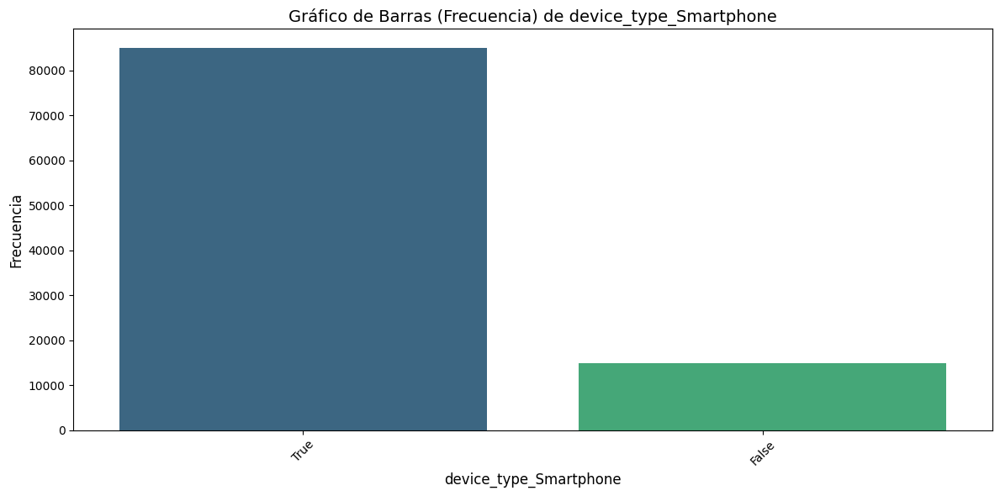

================== Gráfico de barras de device_type_Tablet ===================
Guardado: barras_seaborn_output_especifico/Barra_device_type_Tablet_DataFrame_1.png


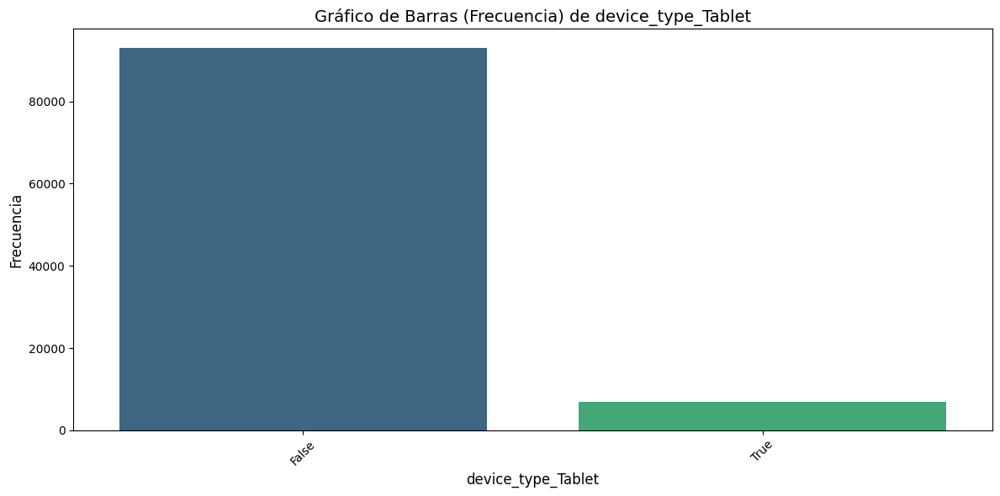

================== Gráfico de barras de age_group_Young ===================
Guardado: barras_seaborn_output_especifico/Barra_age_group_Young_DataFrame_1.png


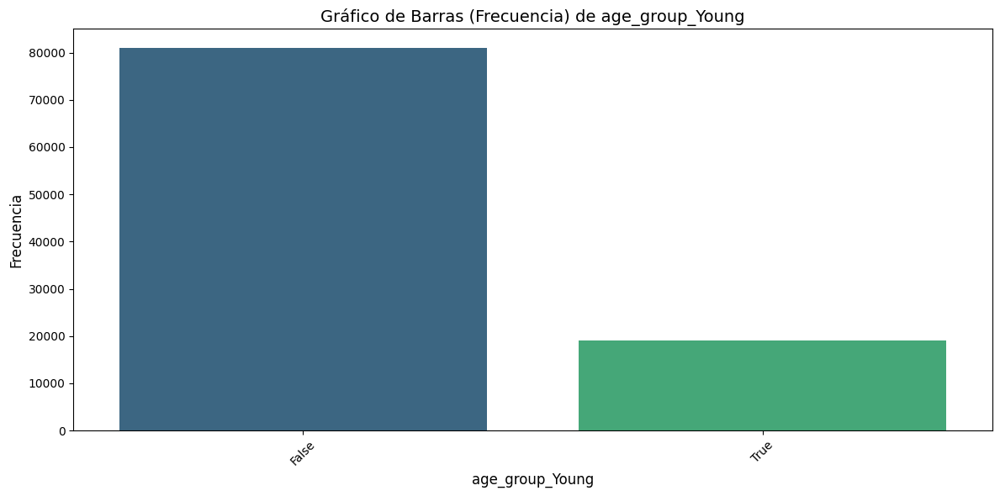

================== Gráfico de barras de age_group_Adult ===================
Guardado: barras_seaborn_output_especifico/Barra_age_group_Adult_DataFrame_1.png


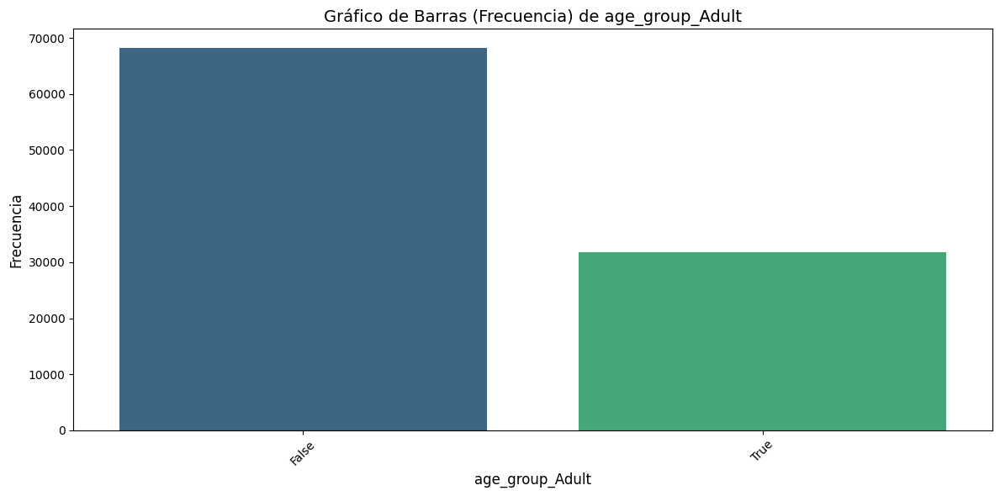

================== Gráfico de barras de age_group_Senior ===================
Guardado: barras_seaborn_output_especifico/Barra_age_group_Senior_DataFrame_1.png


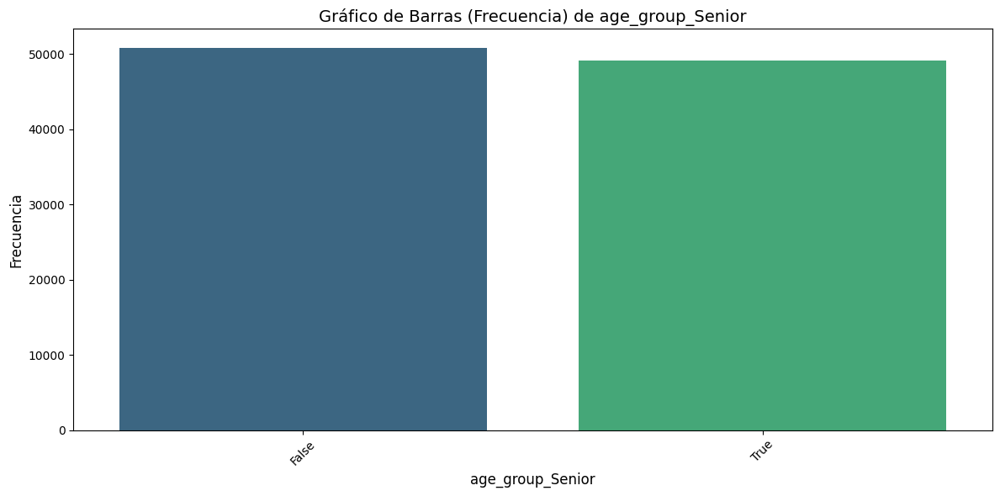


Archivos generados (Específico): ['barras_seaborn_output_especifico/Barra_complaints_DataFrame_1.png', 'barras_seaborn_output_especifico/Barra_high_complaints_flag_DataFrame_1.png', 'barras_seaborn_output_especifico/Barra_location_Mall Central_DataFrame_1.png', 'barras_seaborn_output_especifico/Barra_location_Mall Comidas 1_DataFrame_1.png', 'barras_seaborn_output_especifico/Barra_location_Mall Comidas 2_DataFrame_1.png', 'barras_seaborn_output_especifico/Barra_location_Mega Tienda_DataFrame_1.png', 'barras_seaborn_output_especifico/Barra_device_type_Laptop_DataFrame_1.png', 'barras_seaborn_output_especifico/Barra_device_type_Smartphone_DataFrame_1.png', 'barras_seaborn_output_especifico/Barra_device_type_Tablet_DataFrame_1.png', 'barras_seaborn_output_especifico/Barra_age_group_Young_DataFrame_1.png', 'barras_seaborn_output_especifico/Barra_age_group_Adult_DataFrame_1.png', 'barras_seaborn_output_especifico/Barra_age_group_Senior_DataFrame_1.png']


In [14]:
# ====================================================================================

if __name__ == "__main__":
    # Ejemplo de uso (ajusta save_png a True si quieres guardar los PNG):
    rutas_generadas_especifico = generar_barras_seaborn(
        dataframes=[churn_df],
        output_dir='barras_seaborn_output_especifico',
        save_png=True,  # Cambia a True para guardar los PNG
        include_cols=['complaints', 'high_complaints_flag', 'location_Mall Central', 'location_Mall Comidas 1', 'location_Mall Comidas 2',
                      'location_Mega Tienda', 'device_type_Laptop', 'device_type_Smartphone', 'device_type_Tablet', 'age_group_Young',
                      'age_group_Adult', 'age_group_Senior']
    )
    print("\nArchivos generados (Específico):", rutas_generadas_especifico)


# **ingeieria de Caracteristicas // Featurig Engineering** ⚙
> En nuestro RoadMap se toma el data set como uno al cual se ha limpiado y se le han aplicado las igeierias de caracteritica pertinentes. sin embargo aun es neceario en virtud del ejercicios. comvertir las columnas boleanas en 0 o 1, asi como cambier el nombre de las columnas con espacios.


In [15]:
def convert_boolean_to_binary(
    dataframes: Union[pd.DataFrame, List[pd.DataFrame]],
    output_dir: str = 'converted_dataframes',
    save_csv: bool = True,
    include_cols: Optional[List[str]] = None,
    copy: bool = True
) -> List[pd.DataFrame]:
    """
    Converts boolean (True/False) columns to binary (1/0) in one or more DataFrames.
    Optionally saves the modified DataFrames as CSV files.

    Parameters:
    - dataframes: pd.DataFrame or List[pd.DataFrame]
        Single DataFrame or list of DataFrames to process.
    - output_dir: str
        Directory where modified DataFrames will be saved as CSV files (if save_csv=True).
    - save_csv: bool
        If True, saves the modified DataFrames as CSV files.
    - include_cols: Optional[List[str]]
        List of column names to convert. If None, converts all boolean-type columns.
    - copy: bool
        If True, works on a copy of the DataFrame(s) to avoid modifying the original(s).

    Returns:
    - List[pd.DataFrame]: List of modified DataFrames with boolean columns converted to 1/0.
    """
    # Configure logging
    logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
    logger = logging.getLogger(__name__)

    # Ensure dataframes is a list
    if isinstance(dataframes, pd.DataFrame):
        dataframes = [dataframes]

    # Create output directory if saving CSVs
    if save_csv:
        os.makedirs(output_dir, exist_ok=True)

    # List to store modified DataFrames
    modified_dfs = []
    files_generated = []

    # Process each DataFrame
    for idx, df in enumerate(dataframes):
        df_name = f"DataFrame_{idx + 1}"
        logger.info(f"Processing {df_name}")

        # Create a copy to avoid modifying the original
        df_processed = df.copy() if copy else df

        # Select columns to convert
        if include_cols is None:
            # Automatically detect boolean columns
            cols_to_convert = df_processed.select_dtypes(include=['bool']).columns
        else:
            # Filter specified columns that exist and are boolean
            cols_to_convert = [
                col for col in include_cols
                if col in df_processed.columns and pd.api.types.is_bool_dtype(df_processed[col])
            ]

        if not cols_to_convert:
            logger.warning(f"No boolean columns found in {df_name} for conversion.")
            modified_dfs.append(df_processed)
            continue

        # Convert boolean columns to 1/0
        for col in cols_to_convert:
            logger.info(f"Converting column '{col}' in {df_name} from boolean to binary (1/0)")
            try:
                df_processed[col] = df_processed[col].astype(int)
            except Exception as e:
                logger.error(f"Error converting column '{col}' in {df_name}: {str(e)}")
                continue

        # Save the modified DataFrame as CSV if requested
        if save_csv:
            filename = f'featuring_abril_mallplaza.csv'
            filepath = os.path.join(output_dir, filename)
            try:
                df_processed.to_csv(filepath, index=False)
                logger.info(f"Saved converted DataFrame: {filepath}")
                files_generated.append(filepath)
            except Exception as e:
                logger.error(f"Error saving CSV for {df_name}: {str(e)}")

        modified_dfs.append(df_processed)

    logger.info(f"Conversion complete. Generated {len(files_generated)} CSV files: {files_generated}")
    return modified_dfs

In [16]:
if __name__ == "__main__":
    # Example usage with your churn_df
    # Assuming churn_df contains boolean columns like 'high_complaints_flag', 'location_Mall Central', etc.
    modified_dataframes = convert_boolean_to_binary(
        dataframes=[churn_df],
        output_dir='binary_converted_output',
        save_csv=True,  # Set to True to save CSVs
        include_cols=[
            'high_complaints_flag',
            'location_Mall Central',
            'location_Mall Comidas 1',
            'location_Mall Comidas 2',
            'location_Mega Tienda',
            'device_type_Laptop',
            'device_type_Smartphone',
            'device_type_Tablet',
            'age_group_Young',
            'age_group_Adult',
            'age_group_Senior'
        ],
        copy=True
    )

    # Print summary of the first modified DataFrame
    print("\nModified DataFrame (First 5 rows):")
    print(modified_dataframes[0][[
        'high_complaints_flag',
        'location_Mall Central',
        'location_Mall Comidas 1',
        'location_Mall Comidas 2',
        'location_Mega Tienda',
        'device_type_Laptop',
        'device_type_Smartphone',
        'device_type_Tablet',
        'age_group_Young',
        'age_group_Adult',
        'age_group_Senior'
    ]].head())


Modified DataFrame (First 5 rows):
   high_complaints_flag  location_Mall Central  location_Mall Comidas 1  \
0                     0                      0                        0   
1                     1                      0                        0   
2                     0                      0                        1   
3                     0                      0                        0   
4                     1                      0                        0   

   location_Mall Comidas 2  location_Mega Tienda  device_type_Laptop  \
0                        1                     0                   0   
1                        0                     0                   0   
2                        0                     0                   0   
3                        0                     0                   1   
4                        0                     0                   0   

   device_type_Smartphone  device_type_Tablet  age_group_Young  \
0             

In [17]:
featuring_df= pd.read_csv('binary_converted_output/featuring_abril_mallplaza.csv')
featuring_df.head()


,customerId,name,age,visits,avg_session_time,complaints,total_session_time,complaints_per_visit,log_visits,high_complaints_flag,...,location_Mall Comidas 2,location_Mega Tienda,device_type_Laptop,device_type_Smartphone,device_type_Tablet,age_group_Young,age_group_Adult,age_group_Senior,churn_No,churn_Yes
0,0a415de2-2469-4f34-a77b-a947eef941e9,Matías Frank Méndez Campos,51,3,32.57,0,97.120068,0.000000,1.386294,0,...,1,0,0,1,0,0,0,1,True,False
1,0d3129b4-2525-4235-8765-77eaa606d6cf,Benjamín Joaquín Guajardo Cabrera,25,13,64.52,8,826.446774,0.615385,2.639057,1,...,0,0,0,1,0,1,0,0,False,True
2,5b19695e-2fe1-4375-b723-6aaa414f49b9,Juan Claudio Vera Riquelme,79,27,84.52,2,2287.022366,0.074074,3.332205,0,...,0,0,0,1,0,0,0,1,True,False
3,de67247b-dded-46c2-aeba-1bf16cc73113,Alejandra Sáez,32,28,65.70,1,1828.755038,0.035714,3.367296,0,...,0,0,1,0,0,0,1,0,True,False
4,b2609f86-faf8-4d2e-a569-ba76c4f559d5,Marta Meza González,74,20,27.03,8,543.183295,0.400000,3.044522,1,...,0,0,0,1,0,0,0,1,False,True


In [20]:
featuring_df.rename(columns={'high_complaints_flag': 'high_complaints', 'location_Mall Central': 'location_mall_central', 'location_Mall Comidas 1': 'location_mall_comidas_1', 'location_Mall Comidas 2': 'location_mall_comidas_2', 'location_Mega Tienda': 'location_mega_tienda'}, inplace=True)

In [22]:
print(featuring_df.columns)

Index(['customerId', 'name', 'age', 'visits', 'avg_session_time', 'complaints',
       'total_session_time', 'complaints_per_visit', 'log_visits',
       'high_complaints', 'engagement_score', 'gender_age_ifemale',
       'gender_age_imale', 'gender_age_iother', 'last_visit_date',
       'recency_days', 'tenure_months', 'data_usage_total', 'gender_Female',
       'gender_Male', 'gender_Other', 'location_Arcades', 'location_Cinemas',
       'location_Electronica', 'location_Gimnasios', 'location_mall_central',
       'location_mall_comidas_1', 'location_mall_comidas_2',
       'location_mega_tienda', 'device_type_Laptop', 'device_type_Smartphone',
       'device_type_Tablet', 'age_group_Young', 'age_group_Adult',
       'age_group_Senior', 'churn_No', 'churn_Yes'],
      dtype='object')


CSV exportado exitosamente.☕
Matriz de Correleacio uevas caracteristicas

================== Matriz de Correlación para DataFrame_1 ===================

Matriz de correlación para DataFrame_1:
                              age    visits  avg_session_time  complaints  \
age                      1.000000  0.001206          0.000352    0.001401   
visits                   0.001206  1.000000          0.001320   -0.006219   
avg_session_time         0.000352  0.001320          1.000000    0.001240   
complaints               0.001401 -0.006219          0.001240    1.000000   
total_session_time       0.001227  0.675692          0.643980   -0.004570   
complaints_per_visit    -0.001536 -0.511570          0.001392    0.354563   
log_visits               0.001526  0.944459          0.001656   -0.007176   
high_complaints          0.001324 -0.005484          0.001973    0.866064   
engagement_score         0.000578  0.706200          0.520904   -0.244320   
gender_age_ifemale       0.339574  0.

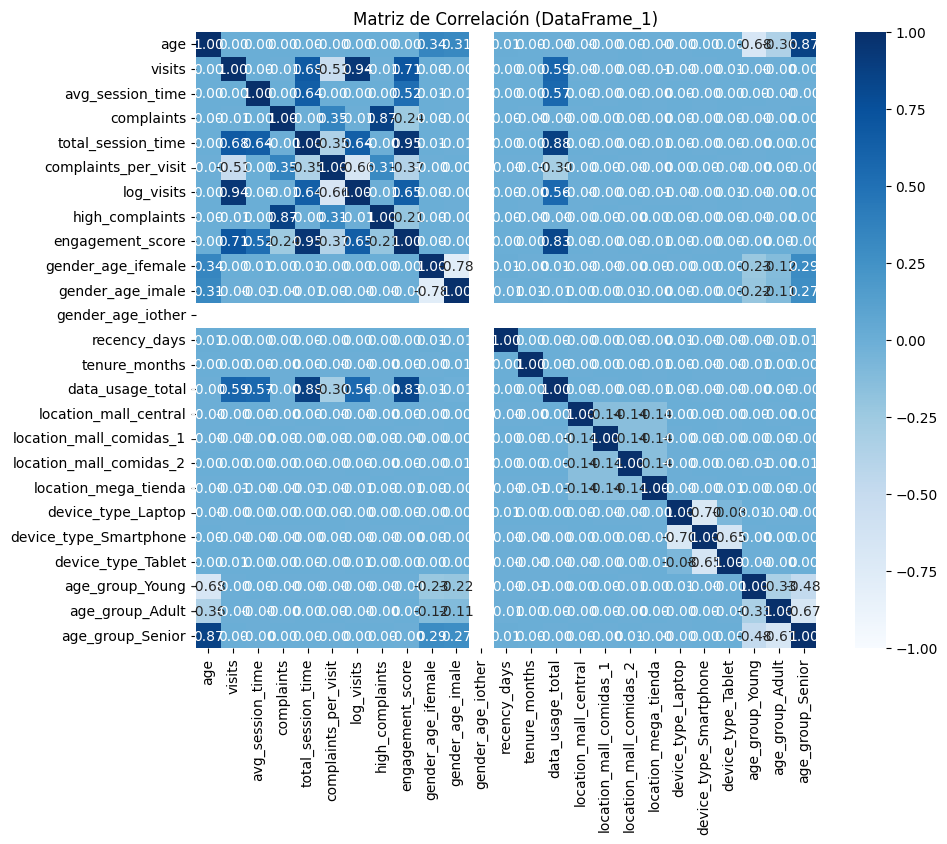

In [23]:

featuring_df.to_csv('content/featuring_abril_mallplaza.csv', index=False)
print("CSV exportado exitosamente.☕")
print("Matriz de Correleacio uevas caracteristicas")
corr_2= generar_matrices_correlacion(dataframes=[featuring_df], output_dir='matrices_correlacion_output', save_png=True, cmap='Blues')

# ***Verifica la Creacion de los CSV en el icono de carpeta.costado izquiero de colab***

> **Diviertete Explorando este Proyecto**

Si te fue de ayuda este proyecto, pasa por mi linkedin y cuentame como te ayudo ☕


In [29]:
def upload_to_s3(local_file,s3_path):
    s3.upload_file(local_file, bucket_name, s3_path)
    print(f"Subido {local_file} a s3://{bucket_name}/{s3_path}")
upload_to_s3('content/featuring_abril_mallplaza.csv', 'warehouse-ml/churn_abril_mallplaza/churn_abril_mallplaza.csv')

Subido content/featuring_abril_mallplaza.csv a s3://mall-flow/warehouse-ml/churn_abril_mallplaza/churn_abril_mallplaza.csv
